In [6]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [7]:
image_path = '../temp/training/images/'
mask_path = '../temp/training/masks/'
SIZE = 128

In [8]:
# lists of images and masks names
image_names = next(os.walk(image_path))[-1]
mask_names = next(os.walk(mask_path))[-1]

image_names.sort()
mask_names.sort()

images = np.zeros(shape=(len(image_names), SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names), SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
    path = image_path + image_names[id]
    img = np.asarray(Image.open(path)).astype("float") / 255.0
    img = cv.resize(img, (SIZE, SIZE), cv.INTER_AREA)
    images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
    path = mask_path + mask_names[id]
    mask = np.asarray(Image.open(path)).astype("float") / 255.0
    mask = cv.resize(mask, (SIZE, SIZE), cv.INTER_AREA)
    masks[id] = mask[:, :, :1]

Mask: 100%|██████████| 4394/4394 [00:13<00:00, 315.36it/s] 


In [10]:
# Train test split
# images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.01)

# Train test split with no images left for testing
images_train = images
images_test = []
mask_train = masks
mask_test = []

print(f'Train images: {len(images_train)}')
print(f'Test images: {len(images_test)}')

Train images: 4394
Test images: 0


In [15]:
augmentation_factor = 3

# image augmentation
def get_augmentation_generators():
    # Define parameters for image data generator
    data_gen_args = dict(
        # rotation_range=15,  # Moderate rotation (lakes can be in any orientation)
        # width_shift_range=0.1,  # Small shifts
        # height_shift_range=0.1,
        # zoom_range=0.1,  # Slight zoom in/out
        horizontal_flip=True,  # Lakes can be flipped
        vertical_flip=True,  # Lakes can be flipped
        # fill_mode="reflect",  # Fill with reflected pixels
        # brightness_range=[0.9, 1.1]     # Subtle brightness changes
    )

    # Create image generator for images
    image_datagen = ImageDataGenerator(**data_gen_args)
    # Create image generator for masks with the same seed
    mask_datagen = ImageDataGenerator(**data_gen_args)

    return image_datagen, mask_datagen


def augment_data(images, masks, augmentation_factor):
    """
    Augment the original dataset by the specified factor.
    Returns augmented images and masks.
    """
    image_datagen, mask_datagen = get_augmentation_generators()

    augmented_images = []
    augmented_masks = []

    print(f"Generating {augmentation_factor}x augmented data...")

    for i in tqdm(range(len(images)), desc="Augmenting"):
        # Get original image and mask
        img = images[i]
        mask = masks[i]

        # Add original image and mask to the augmented datasets
        augmented_images.append(img)
        augmented_masks.append(mask)

        # Generate augmentations
        for j in range(augmentation_factor - 1):
            # Set the same seed for both generators to ensure identical transformations
            seed = np.random.randint(1, 1000)

            # Reshape to match ImageDataGenerator expectations (batch dimension needed)
            img_batch = np.expand_dims(img, 0)
            mask_batch = np.expand_dims(mask, 0)

            # Generate augmented image
            img_gen = image_datagen.flow(img_batch, batch_size=1, seed=seed)
            mask_gen = mask_datagen.flow(mask_batch, batch_size=1, seed=seed)

            # Get the augmented image and mask
            aug_img = next(img_gen)[0]  # [0] to extract from batch
            aug_mask = next(mask_gen)[0]

            augmented_images.append(aug_img)
            augmented_masks.append(aug_mask)

    return np.array(augmented_images), np.array(augmented_masks)


# Apply augmentation to training data
augmented_images_train, augmented_masks_train = augment_data(
    images_train, mask_train, augmentation_factor
)

print(f"Original training data size: {len(images_train)}")
print(f"Augmented training data size: {len(augmented_images_train)}")

Generating 3x augmented data...


Augmenting: 100%|██████████| 4394/4394 [00:01<00:00, 3338.66it/s]


Original training data size: 4394
Augmented training data size: 13182


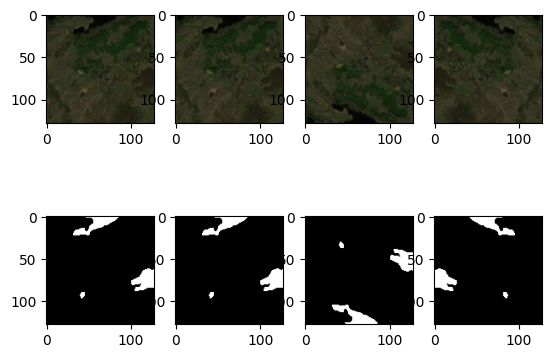

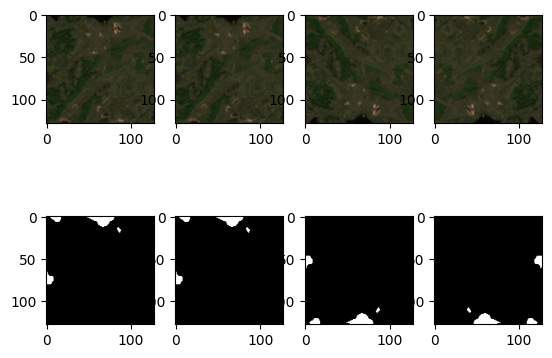

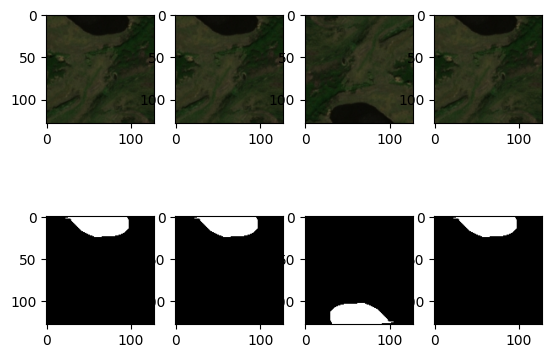

In [16]:
# verify image augmentation is working correctly

for i in range(3):
    img = images_train[i]
    mask = mask_train[i]

    fig, ax = plt.subplots(2, augmentation_factor + 1)
    ax[0][0].imshow(img)
    
    for j in range(augmentation_factor):
        index = i * augmentation_factor + j
        ax[0][j + 1].imshow(augmented_images_train[index])
        ax[1][j + 1].imshow(augmented_masks_train[index], cmap="gray")
    
    ax[1][0].imshow(mask, cmap="gray")

In [17]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [18]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer=input_layer, start_neurons=16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
# model.summary()

I0000 00:00:1749540572.537487   20210 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9099 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1


In [19]:
# Post Process
def mask_threshold(image, threshold=0.25):
    return image > threshold


# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
    def __init__(self, save=False):
        self.save = save

    def on_epoch_end(self, epoch, logs=None):
        k = np.random.randint(len(augmented_images_train))
        original_image = augmented_images_train[k][np.newaxis, ...]
        predicted_mask = self.model.predict(original_image).reshape(128, 128)
        proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
        proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
        proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
        proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
        mask = augmented_masks_train[k].reshape(128, 128)

        plt.figure(figsize=(15, 10))

        plt.subplot(1, 7, 1)
        plt.imshow(original_image[0])
        plt.title("Orginal Image")

        plt.subplot(1, 7, 2)
        plt.imshow(predicted_mask, cmap="gray")
        plt.title("Predicted Mask")

        plt.subplot(1, 7, 3)
        plt.imshow(mask, cmap="gray")
        plt.title("Orginal Mask")

        plt.subplot(1, 7, 4)
        plt.imshow(proc_mask02, cmap="gray")
        plt.title("Processed: 0.2")

        plt.subplot(1, 7, 5)
        plt.imshow(proc_mask03, cmap="gray")
        plt.title("Processed: 0.3")

        plt.subplot(1, 7, 6)
        plt.imshow(proc_mask04, cmap="gray")
        plt.title("Processed: 0.4")

        plt.subplot(1, 7, 6)
        plt.imshow(proc_mask05, cmap="gray")
        plt.title("Processed: 0.5")

        plt.tight_layout()
        plt.show()

Epoch 1/100


I0000 00:00:1749540607.526832   21175 service.cc:148] XLA service 0x7f4ccc0045c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1749540607.527042   21175 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce GTX 1080 Ti, Compute Capability 6.1
2025-06-10 00:30:07.619603: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1749540608.002394   21175 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-06-10 00:30:08.726434: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[32,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_con

  1/412 ━━━━━━━━━━━━━━━━━━━━ 1:21:03 12s/step - accuracy: 0.2748 - loss: 0.6962

2025-06-10 00:30:17.116104: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1749540617.145520   21175 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


411/412 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.7306 - loss: 0.4065

2025-06-10 00:30:34.721323: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[30,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[30,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-06-10 00:30:34.733277: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[30,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[30,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationFor

412/412 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.7307 - loss: 0.4063

2025-06-10 00:30:42.195905: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion', 8 bytes spill stores, 8 bytes spill loads

2025-06-10 00:30:42.454768: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-06-10 00:30:

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 723ms/step


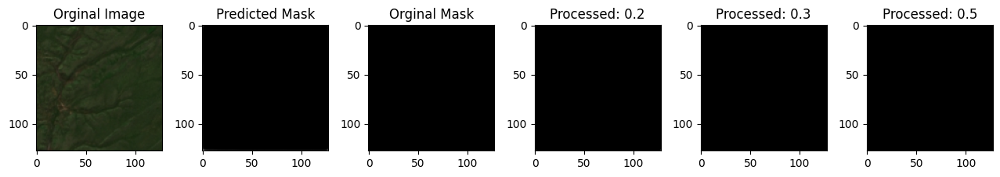

412/412 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - accuracy: 0.7308 - loss: 0.4061
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7944 - loss: 0.267


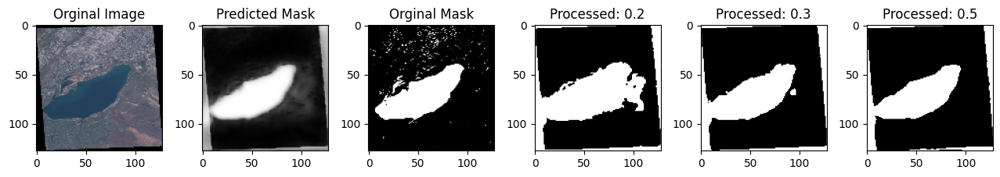

412/412 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - accuracy: 0.7944 - loss: 0.2674
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7986 - loss: 0.251


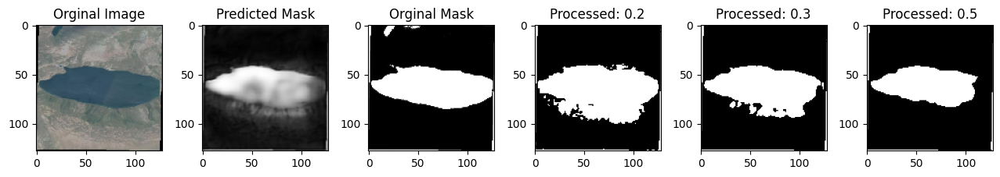

412/412 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - accuracy: 0.7986 - loss: 0.2514
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8043 - loss: 0.23


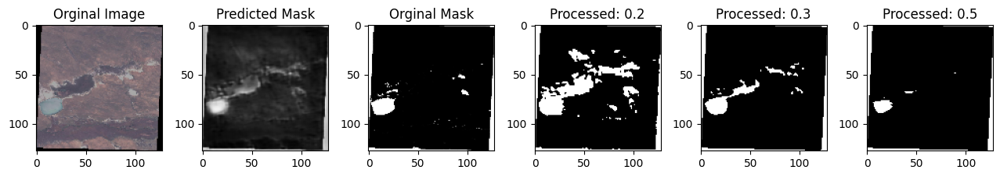

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - accuracy: 0.8043 - loss: 0.2349
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8072 - loss: 0.22


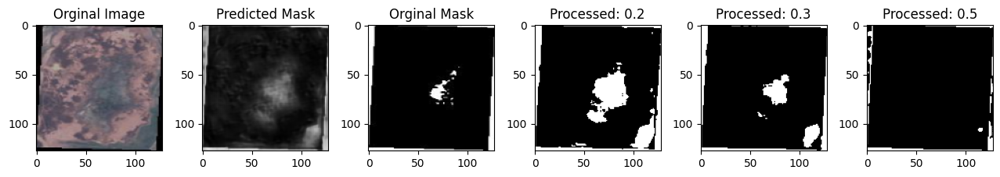

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8073 - loss: 0.2286
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8169 - loss: 0.20


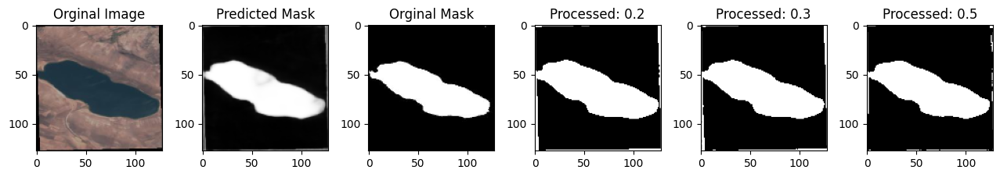

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8169 - loss: 0.2049
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8199 - loss: 0.195


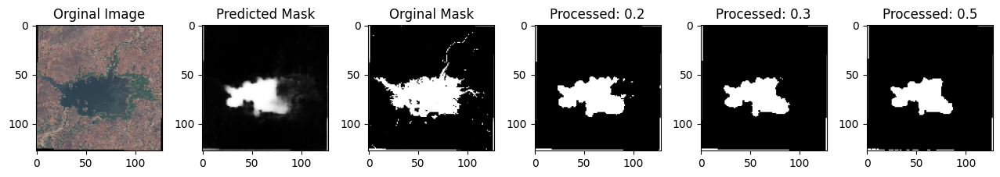

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8199 - loss: 0.1958
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8275 - loss: 0.18


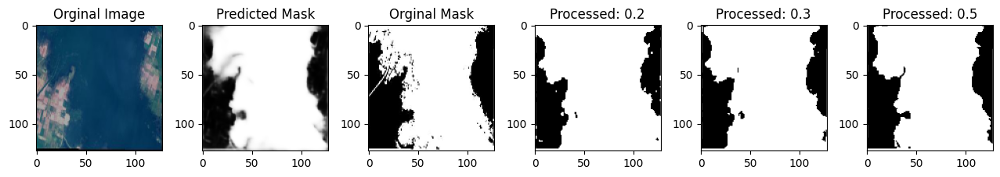

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8275 - loss: 0.1819
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8229 - loss: 0.18


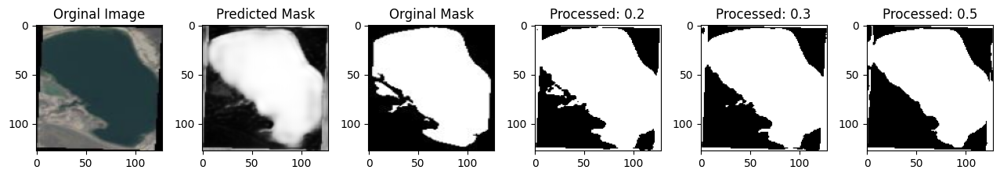

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8229 - loss: 0.1831
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8265 - loss: 0.175


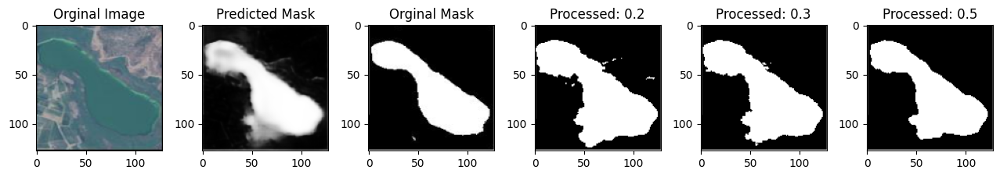

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8265 - loss: 0.1759
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8274 - loss: 0.17


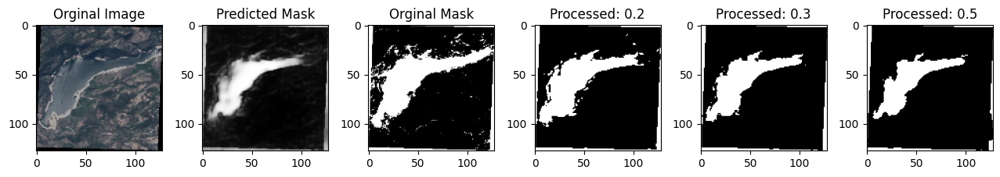

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8274 - loss: 0.1753
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8265 - loss: 0.171


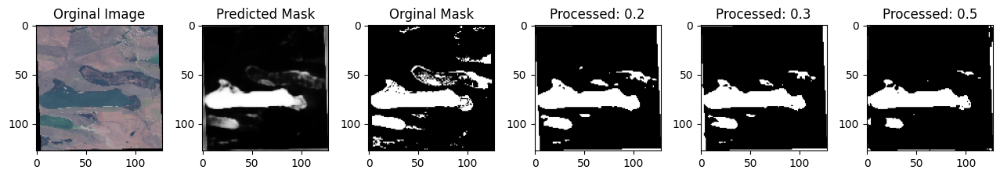

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8265 - loss: 0.1710
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8264 - loss: 0.17


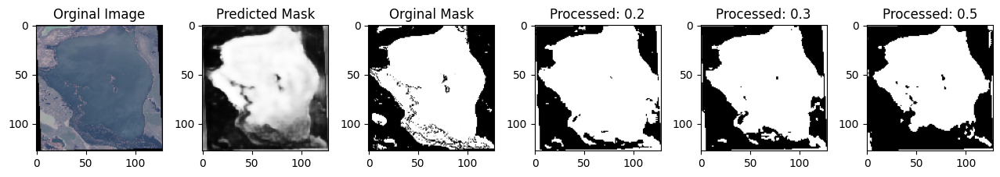

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8264 - loss: 0.1733
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8261 - loss: 0.16


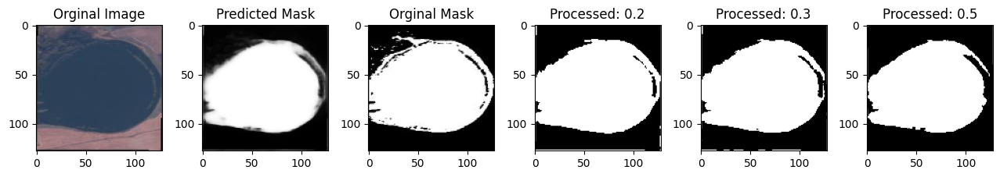

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8261 - loss: 0.1681
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8304 - loss: 0.16


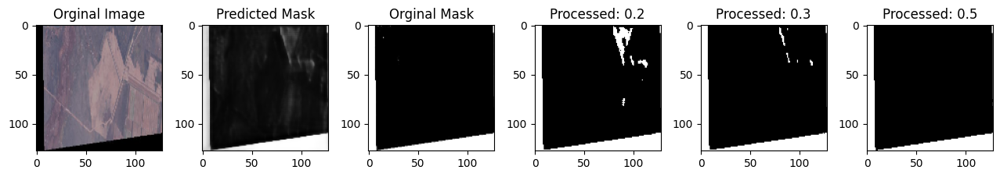

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8304 - loss: 0.1637
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/stepstep - accuracy: 0.8299 - loss: 0.163


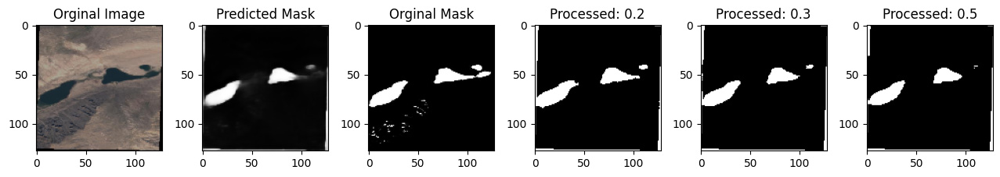

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8299 - loss: 0.1632
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8318 - loss: 0.16


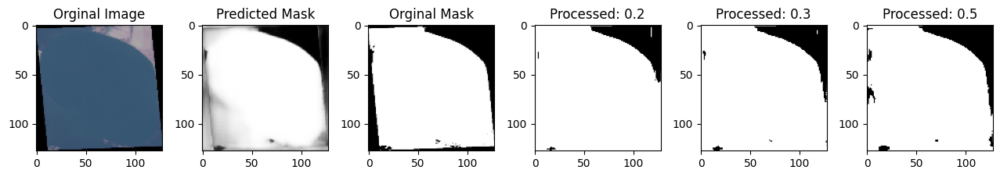

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8318 - loss: 0.1608
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8320 - loss: 0.15


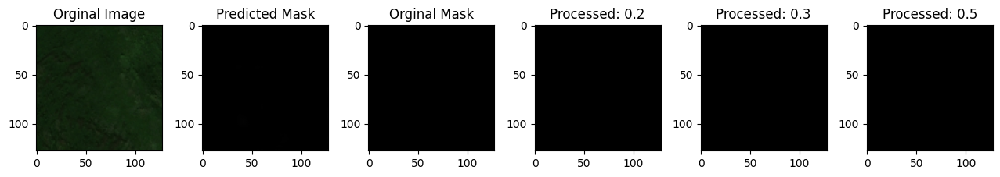

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8320 - loss: 0.1593
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8278 - loss: 0.162


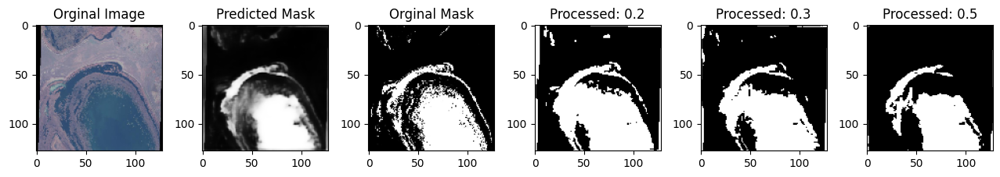

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8278 - loss: 0.1623
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8372 - loss: 0.14


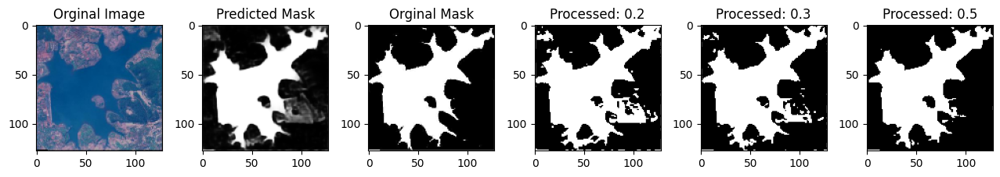

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8372 - loss: 0.1499
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8310 - loss: 0.16


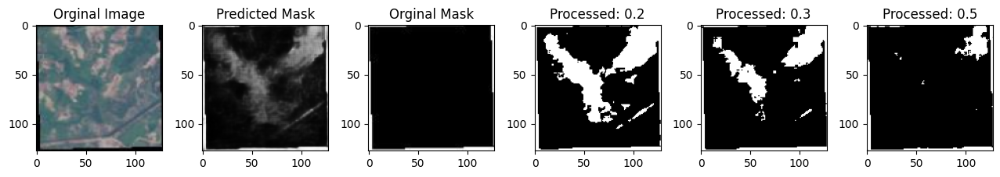

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8310 - loss: 0.1611
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8315 - loss: 0.15


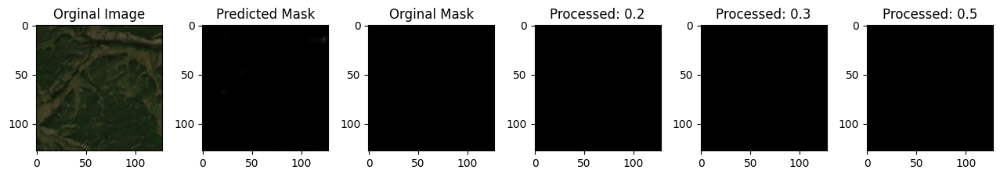

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8315 - loss: 0.1592
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8320 - loss: 0.154


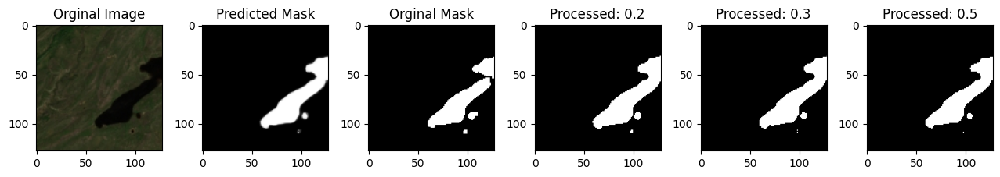

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8320 - loss: 0.1545
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8328 - loss: 0.15


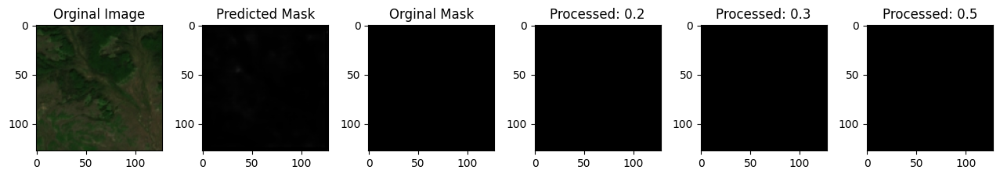

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8328 - loss: 0.1530
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8350 - loss: 0.15


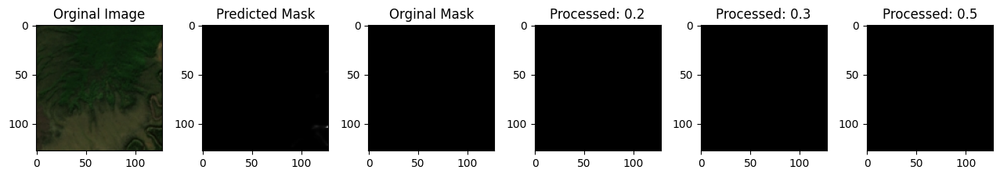

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8350 - loss: 0.1513
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8342 - loss: 0.14


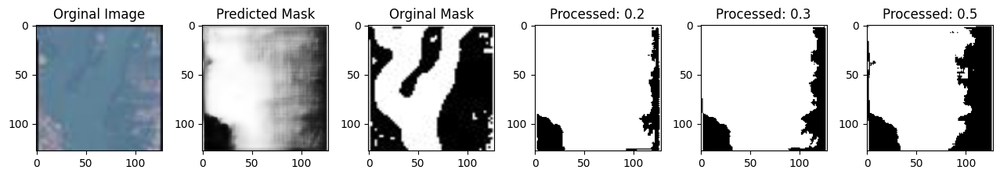

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8342 - loss: 0.1491
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8317 - loss: 0.15


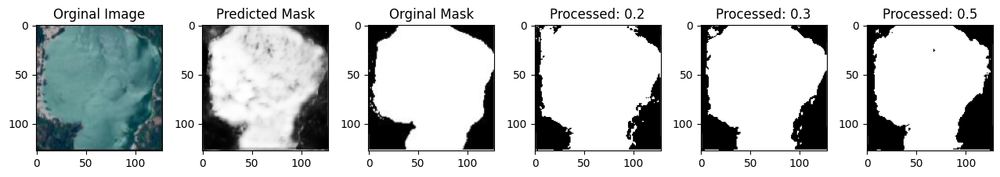

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8317 - loss: 0.1527
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8301 - loss: 0.16


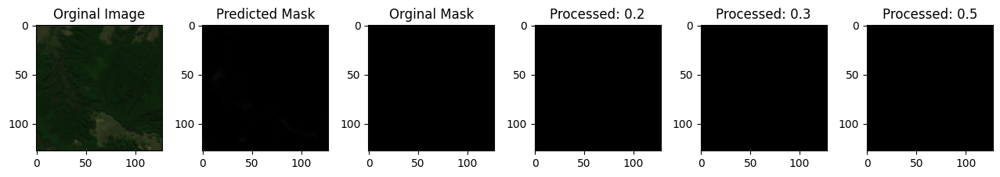

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8301 - loss: 0.1603
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8389 - loss: 0.144


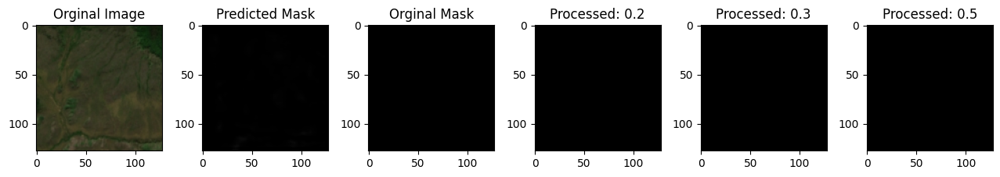

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8389 - loss: 0.1447
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8339 - loss: 0.14


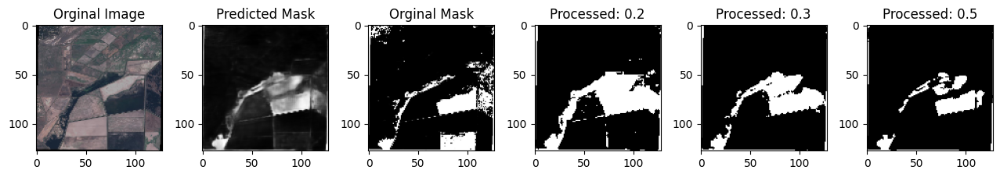

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8339 - loss: 0.1466
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8355 - loss: 0.14


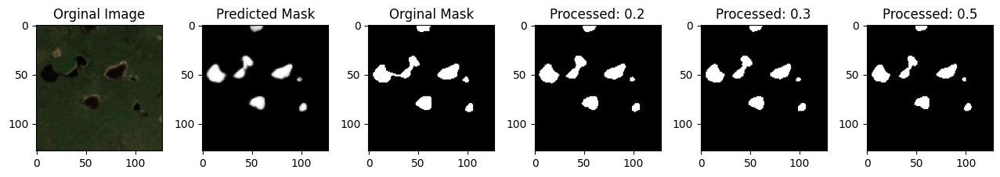

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8355 - loss: 0.1476
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8345 - loss: 0.15


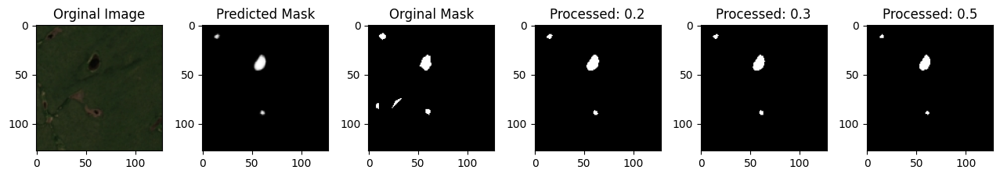

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8345 - loss: 0.1502
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8381 - loss: 0.142


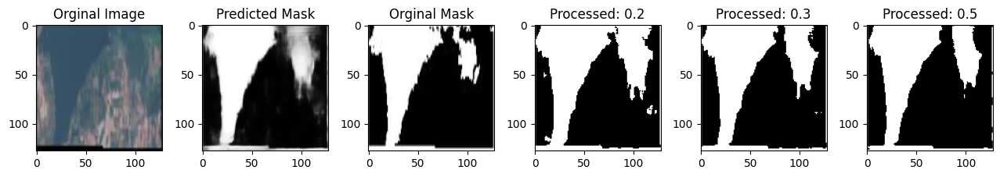

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8381 - loss: 0.1425
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8344 - loss: 0.140


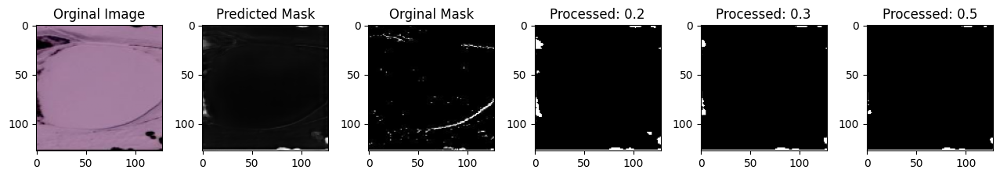

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8344 - loss: 0.1400
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8372 - loss: 0.139


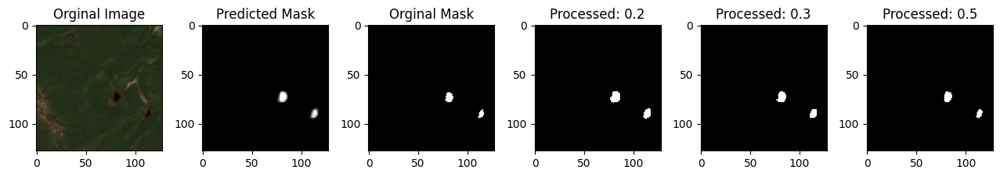

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8372 - loss: 0.1392
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8279 - loss: 0.170


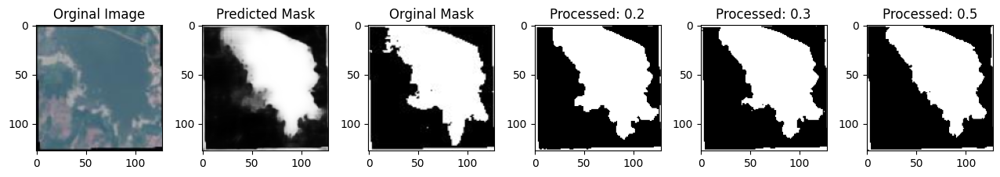

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - accuracy: 0.8279 - loss: 0.1701
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.8321 - loss: 0.154


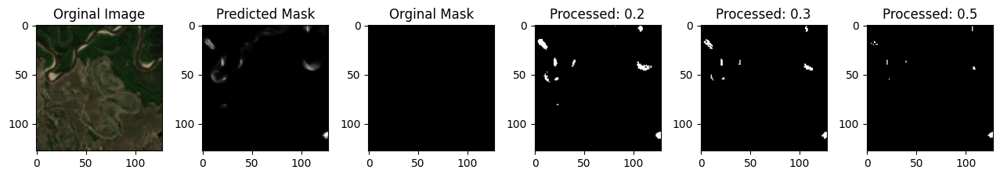

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8321 - loss: 0.1543
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8404 - loss: 0.13


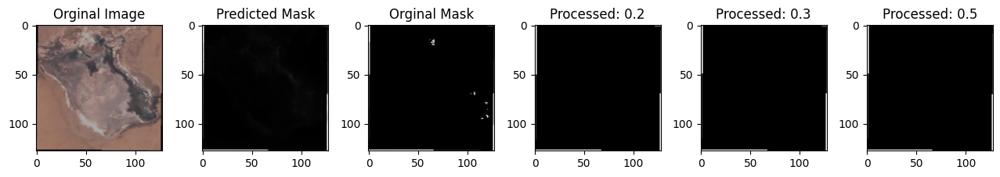

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8404 - loss: 0.1397
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8402 - loss: 0.14


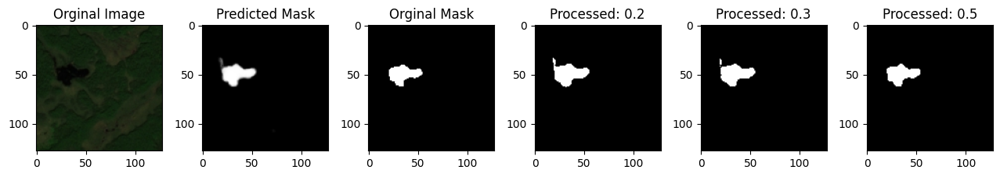

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8402 - loss: 0.1411
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8387 - loss: 0.140


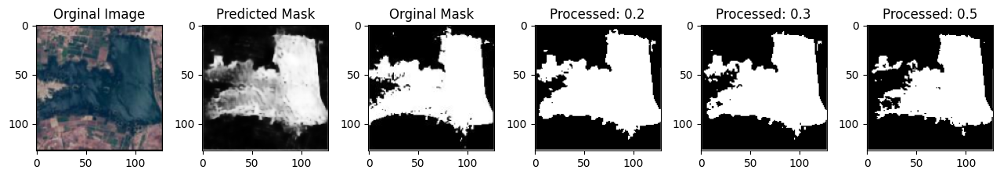

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8387 - loss: 0.1408
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8369 - loss: 0.13


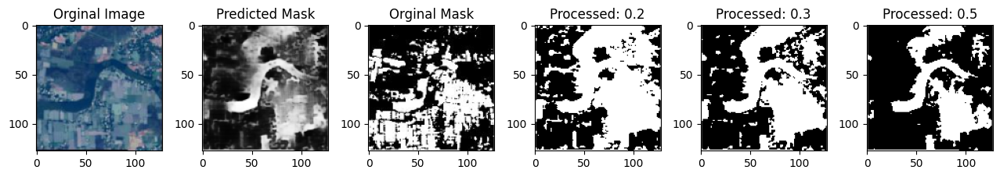

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8369 - loss: 0.1378
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8351 - loss: 0.141


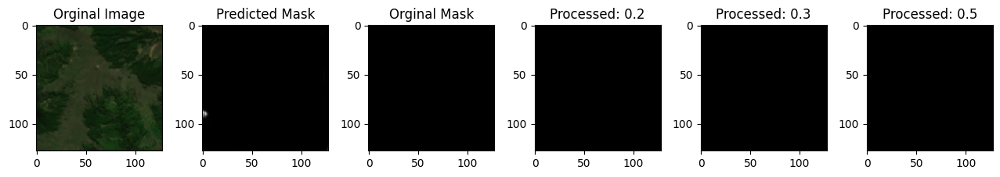

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8351 - loss: 0.1418
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8403 - loss: 0.13


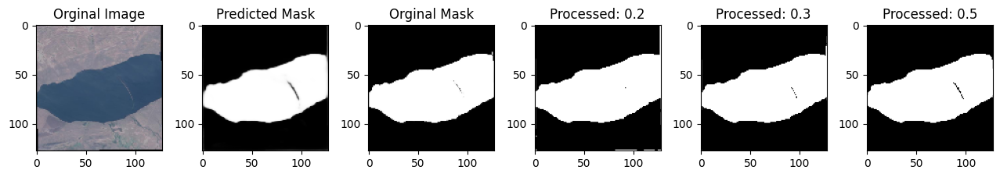

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8403 - loss: 0.1344
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8397 - loss: 0.132


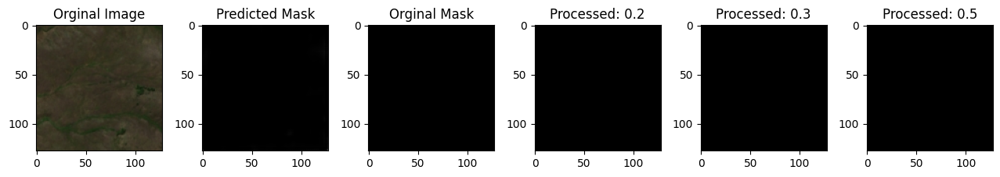

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - accuracy: 0.8397 - loss: 0.1329
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8389 - loss: 0.13


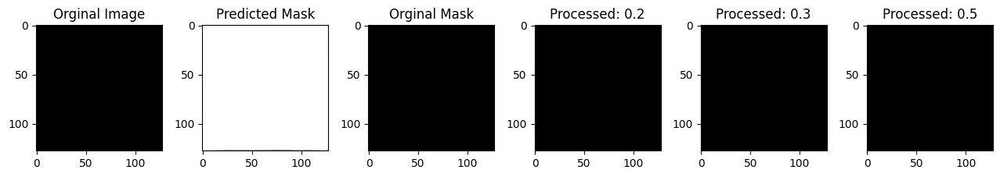

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8388 - loss: 0.1331
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8399 - loss: 0.132


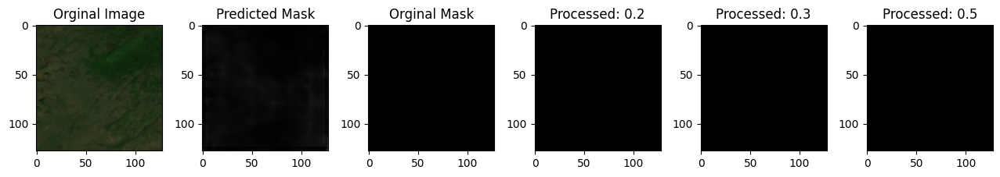

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8399 - loss: 0.1321
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8344 - loss: 0.15


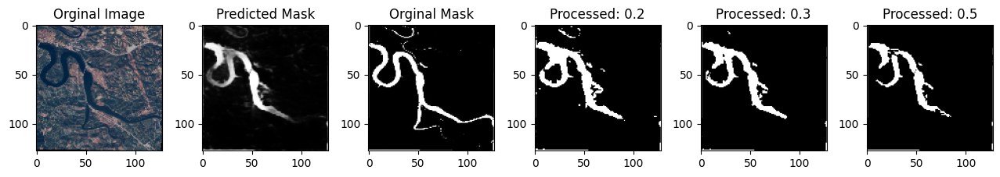

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8344 - loss: 0.1544
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8414 - loss: 0.13


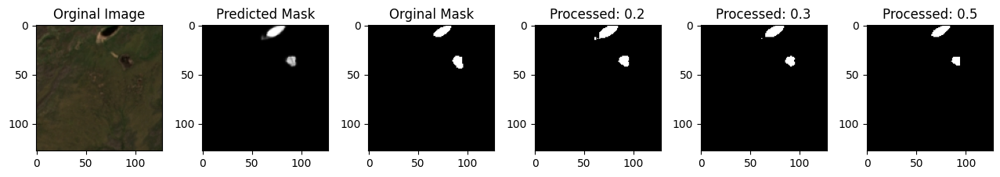

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8414 - loss: 0.1320
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8385 - loss: 0.135


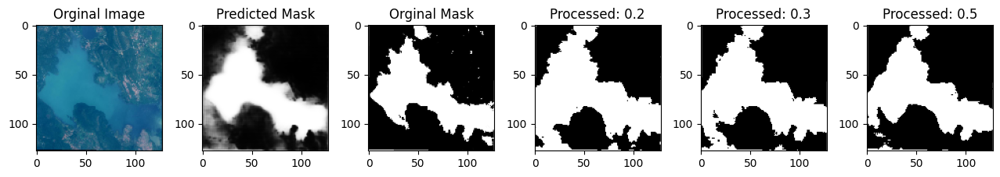

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8385 - loss: 0.1355
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8374 - loss: 0.13


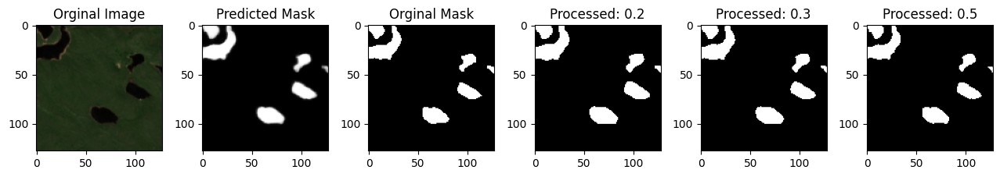

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8374 - loss: 0.1371
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8375 - loss: 0.13


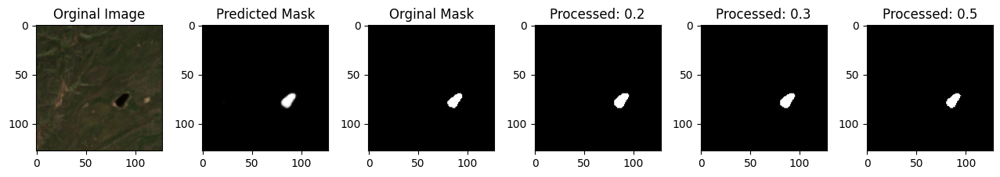

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8375 - loss: 0.1377
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8402 - loss: 0.13


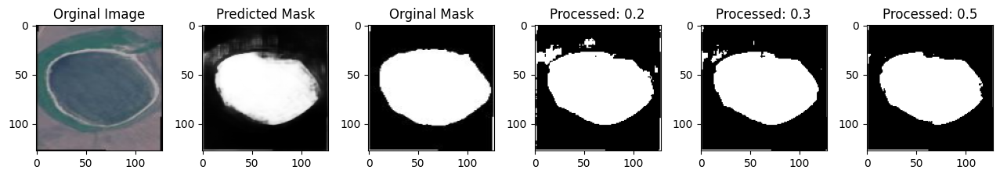

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - accuracy: 0.8401 - loss: 0.1397
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8383 - loss: 0.13


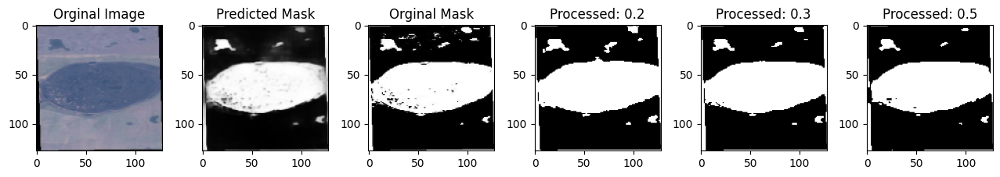

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8383 - loss: 0.1379
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8355 - loss: 0.139


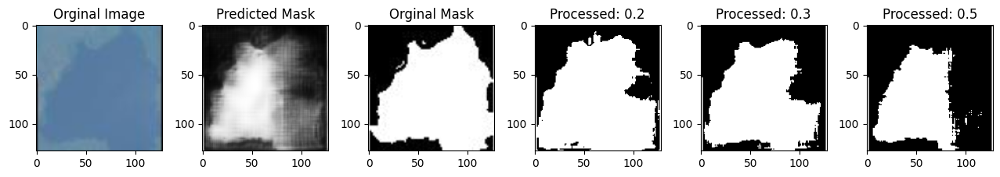

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8355 - loss: 0.1394
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8400 - loss: 0.13


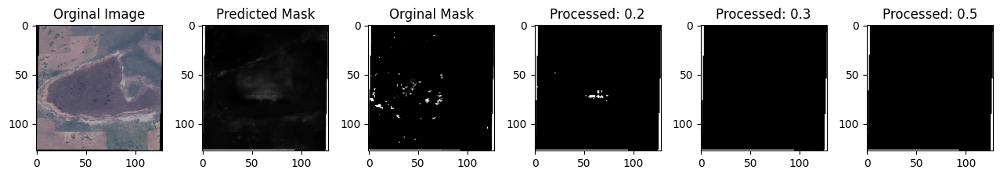

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8400 - loss: 0.1322
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8398 - loss: 0.12


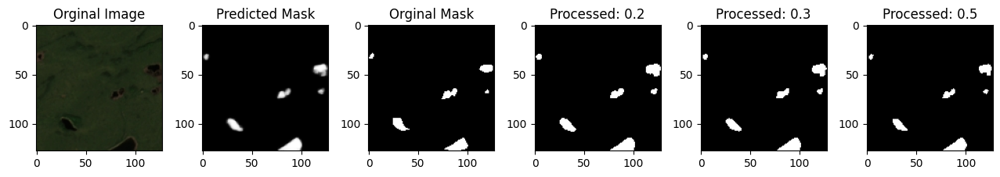

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8398 - loss: 0.1277
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8408 - loss: 0.12


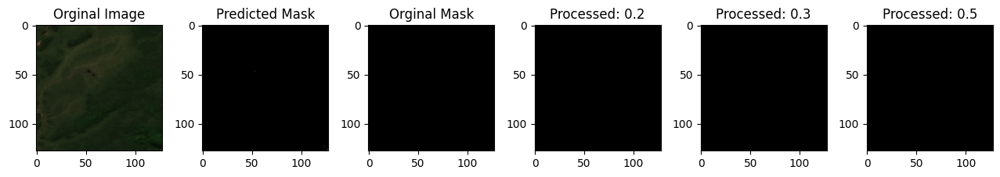

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8408 - loss: 0.1278
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8374 - loss: 0.14


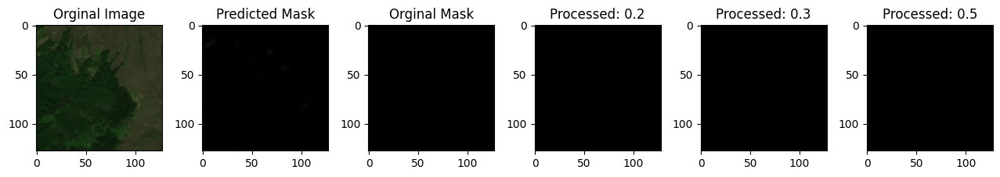

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - accuracy: 0.8374 - loss: 0.1413
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8400 - loss: 0.12


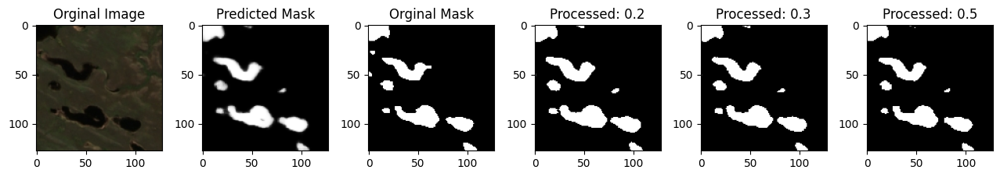

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8400 - loss: 0.1292
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8392 - loss: 0.13


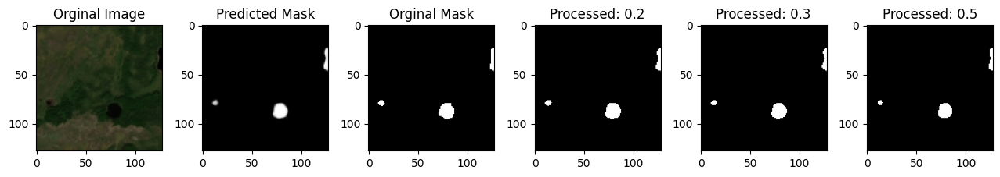

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8392 - loss: 0.1327
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8410 - loss: 0.125


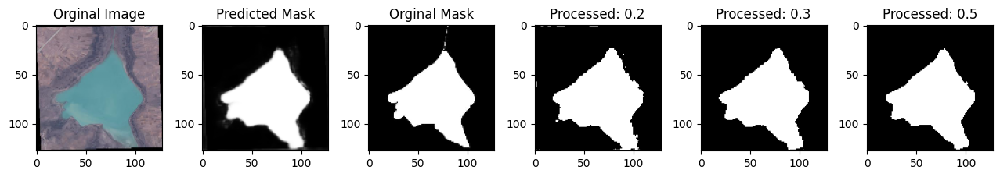

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8410 - loss: 0.1258
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8434 - loss: 0.12


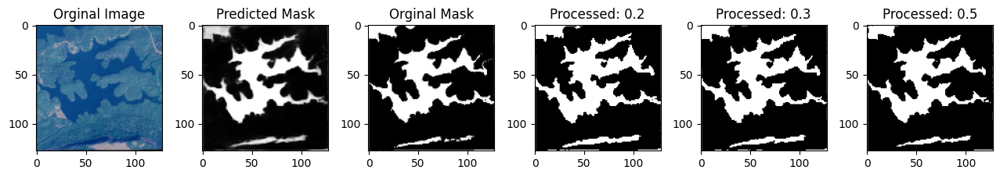

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8434 - loss: 0.1241
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8438 - loss: 0.12


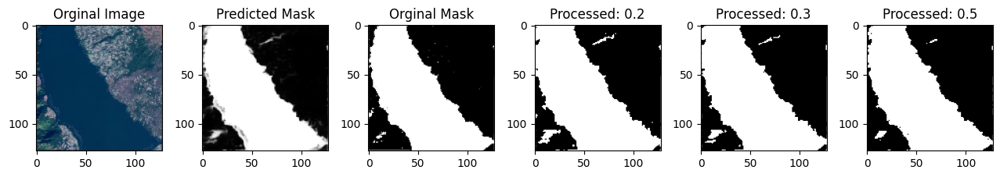

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8438 - loss: 0.1230
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8407 - loss: 0.12


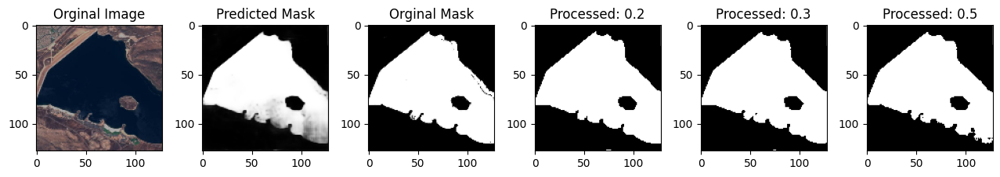

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8407 - loss: 0.1267
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8424 - loss: 0.125


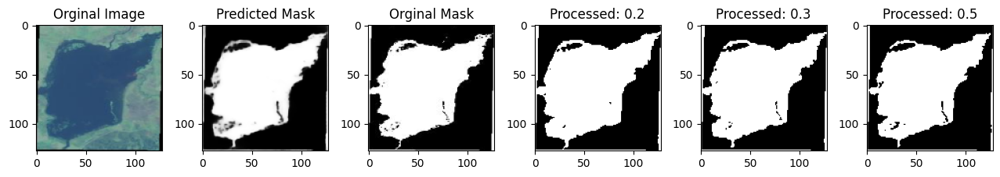

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8424 - loss: 0.1251
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8384 - loss: 0.13


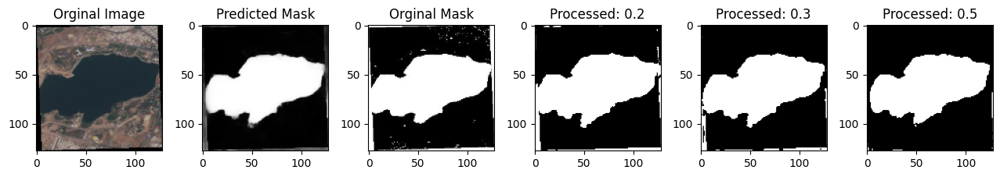

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8384 - loss: 0.1303
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8427 - loss: 0.12


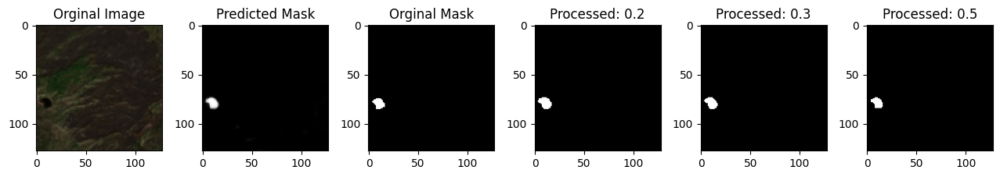

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8427 - loss: 0.1234
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8401 - loss: 0.12


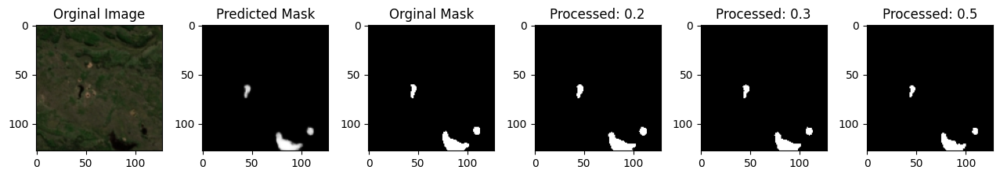

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8401 - loss: 0.1276
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8416 - loss: 0.124


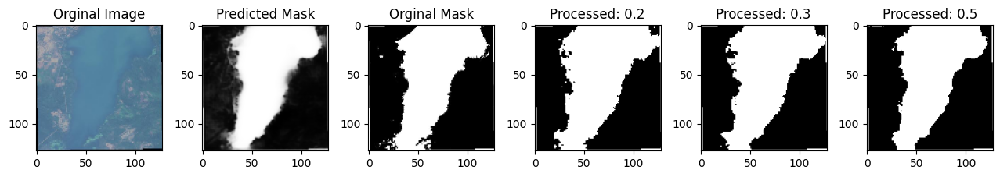

412/412 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - accuracy: 0.8416 - loss: 0.1244
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8413 - loss: 0.12


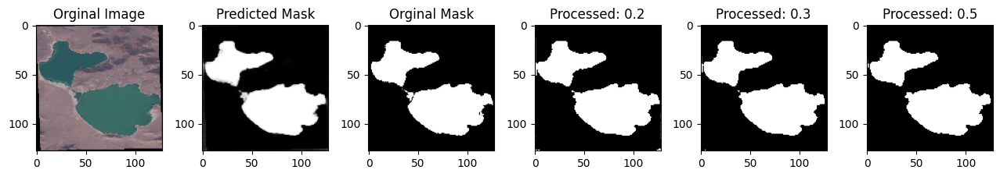

412/412 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - accuracy: 0.8413 - loss: 0.1225
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8412 - loss: 0.12


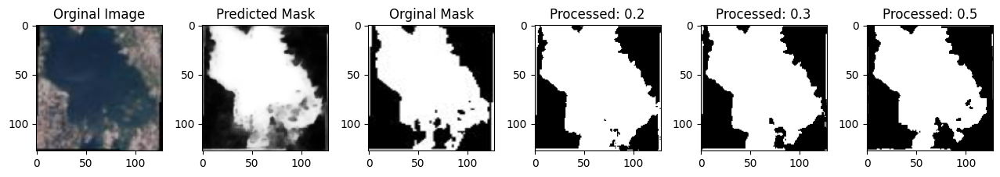

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8412 - loss: 0.1282
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8408 - loss: 0.12


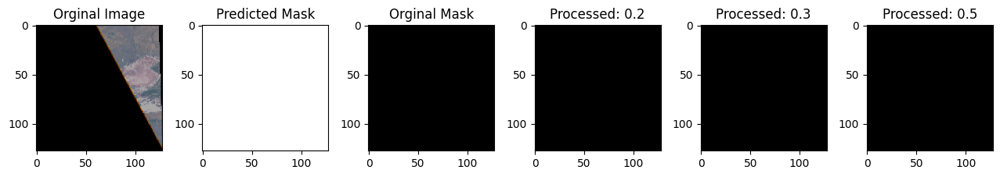

412/412 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - accuracy: 0.8408 - loss: 0.1240
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8429 - loss: 0.11


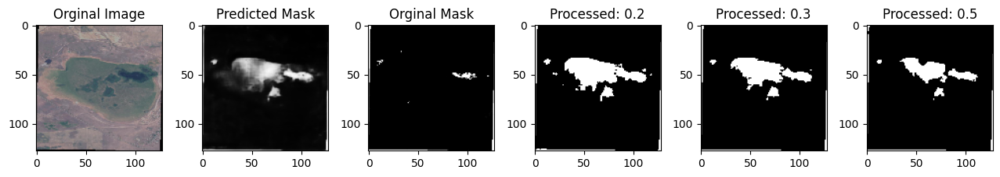

412/412 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - accuracy: 0.8429 - loss: 0.1190
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8418 - loss: 0.123


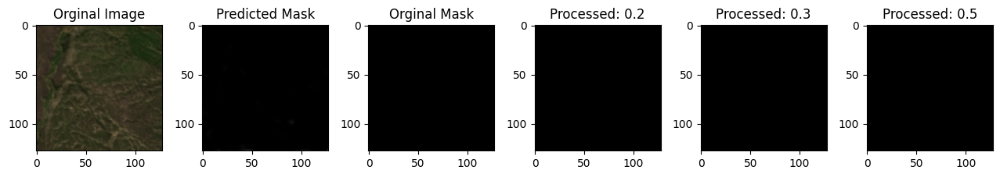

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8418 - loss: 0.1231
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8432 - loss: 0.11


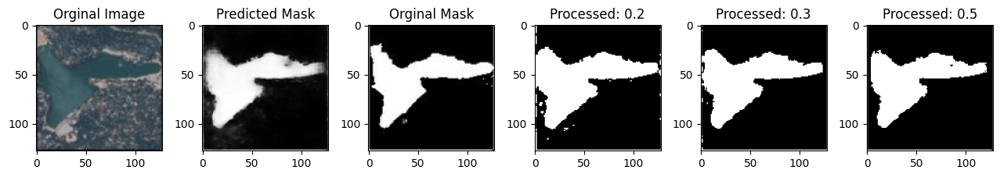

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8432 - loss: 0.1195
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8389 - loss: 0.12


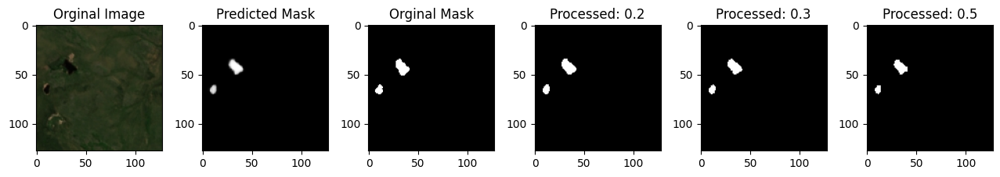

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8389 - loss: 0.1234
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8448 - loss: 0.12


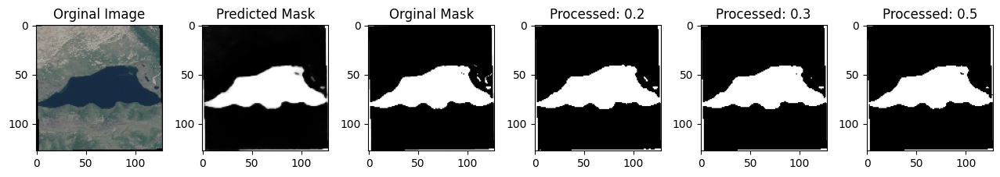

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - accuracy: 0.8448 - loss: 0.1219
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8415 - loss: 0.129


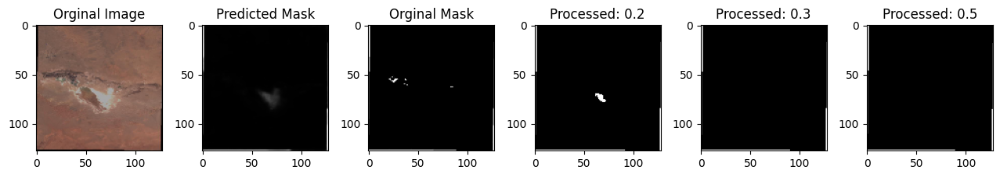

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8415 - loss: 0.1293
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8412 - loss: 0.121


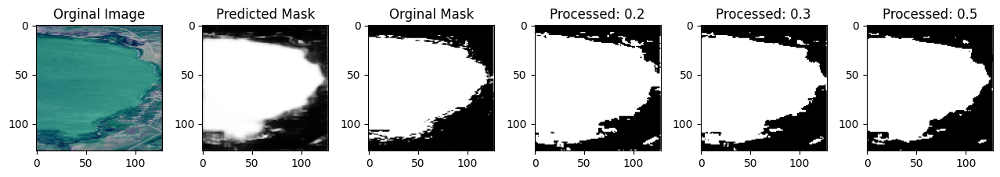

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8412 - loss: 0.1215
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8437 - loss: 0.11


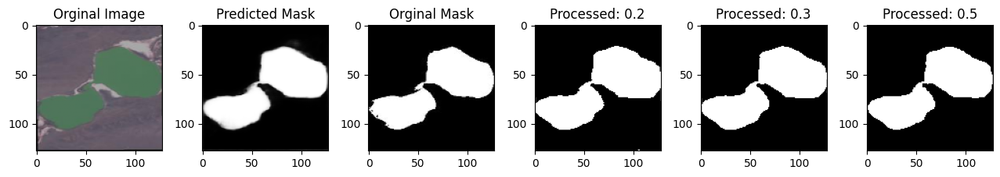

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8437 - loss: 0.1186
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8441 - loss: 0.120


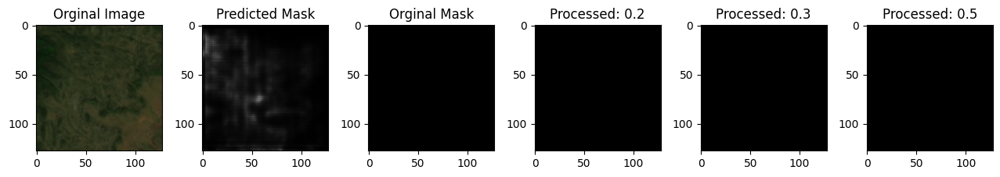

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8441 - loss: 0.1204
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8435 - loss: 0.118


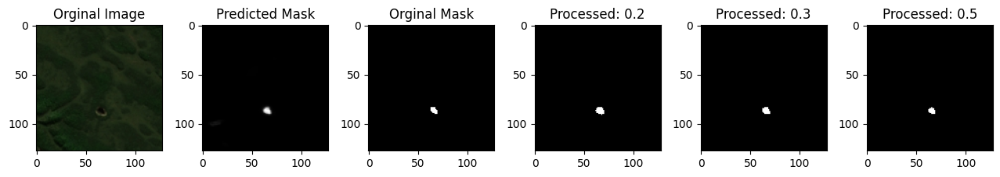

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8435 - loss: 0.1189
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8435 - loss: 0.11


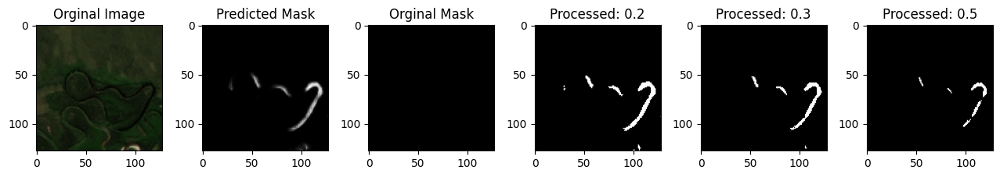

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8435 - loss: 0.1181
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8439 - loss: 0.11


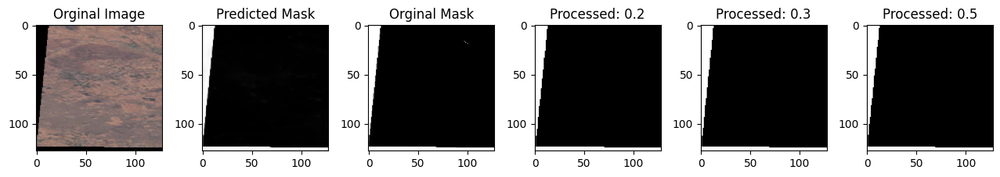

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8439 - loss: 0.1165
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8418 - loss: 0.12


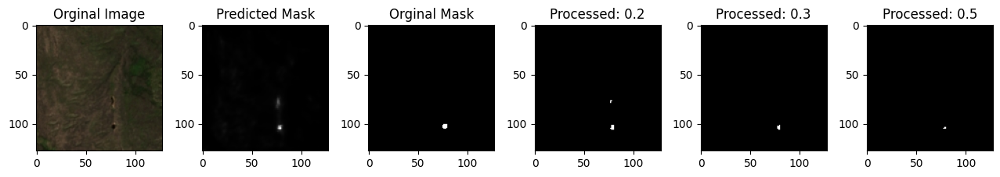

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8418 - loss: 0.1251
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8402 - loss: 0.13


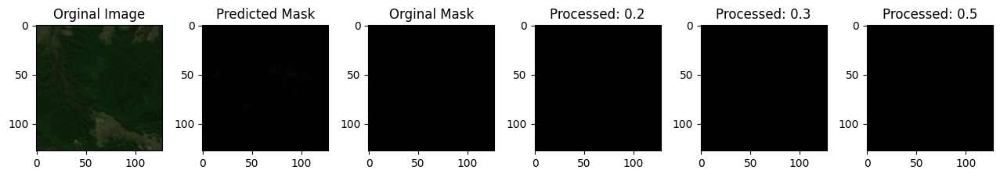

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8402 - loss: 0.1328
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.8444 - loss: 0.120


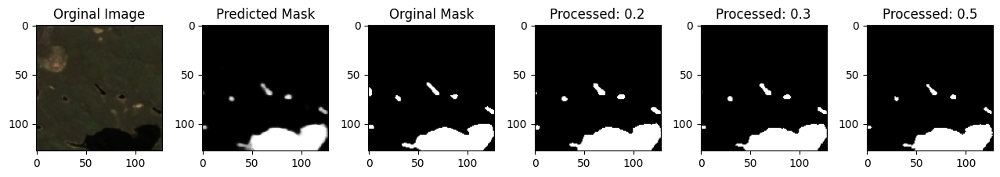

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8444 - loss: 0.1201
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8440 - loss: 0.115


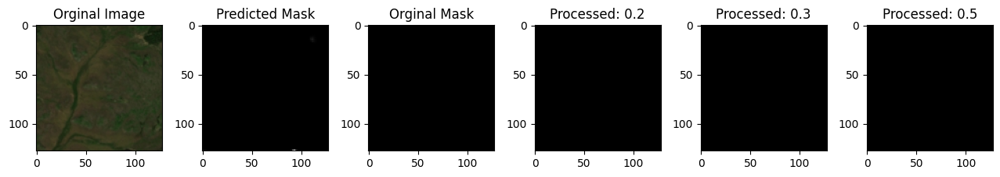

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8440 - loss: 0.1150
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8430 - loss: 0.11


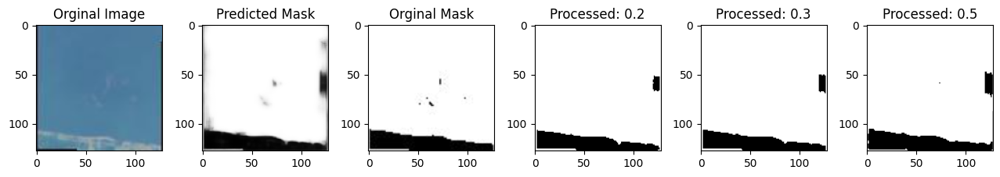

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8430 - loss: 0.1157
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8419 - loss: 0.12


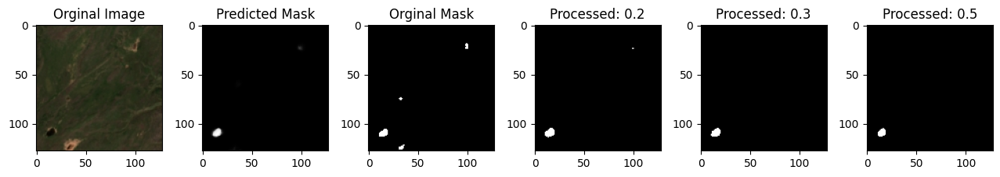

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8419 - loss: 0.1271
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8448 - loss: 0.11


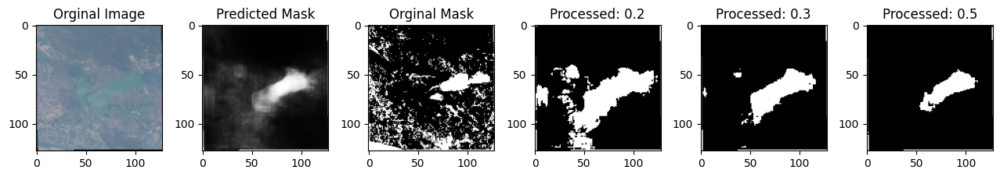

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8448 - loss: 0.1164
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8431 - loss: 0.11


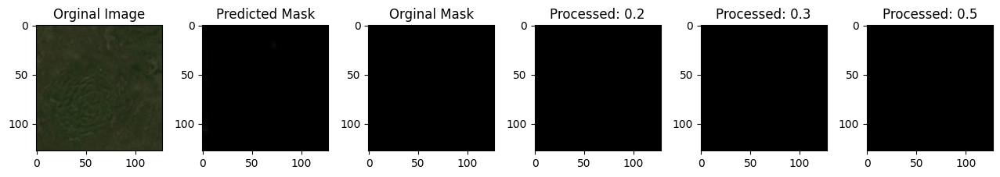

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8431 - loss: 0.1168
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8420 - loss: 0.11


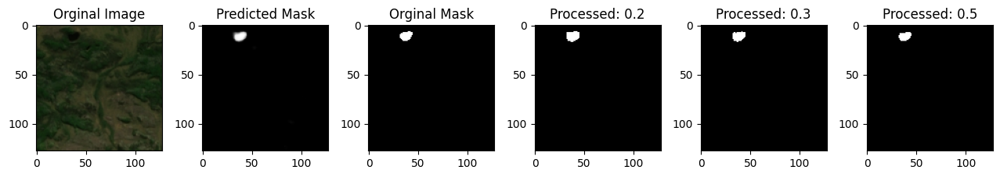

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8420 - loss: 0.1145
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8445 - loss: 0.114


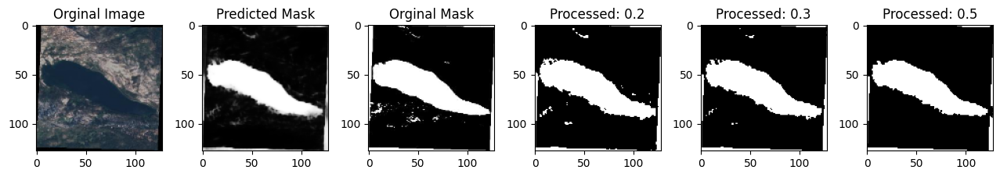

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8445 - loss: 0.1147
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8453 - loss: 0.11


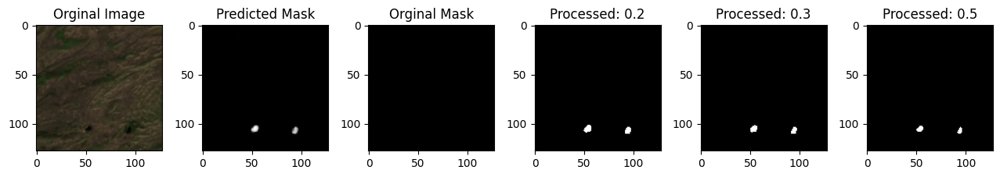

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8453 - loss: 0.1143
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8408 - loss: 0.12


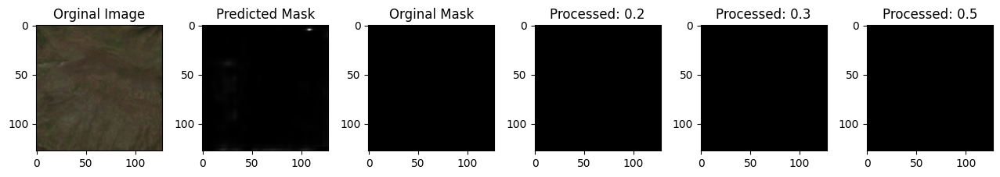

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8408 - loss: 0.1265
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8413 - loss: 0.118


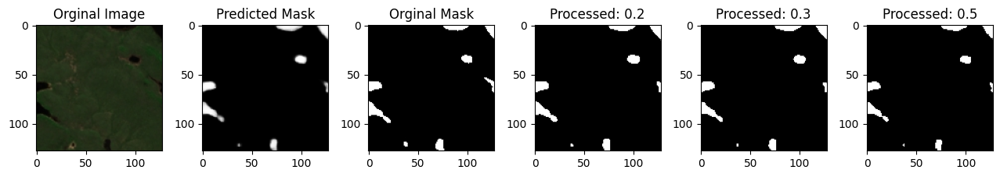

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8413 - loss: 0.1188
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8286 - loss: 0.171


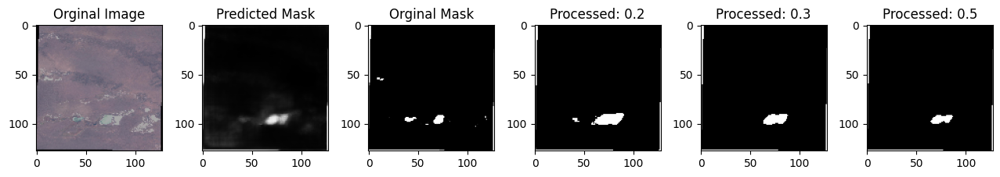

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8286 - loss: 0.1714
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8368 - loss: 0.13


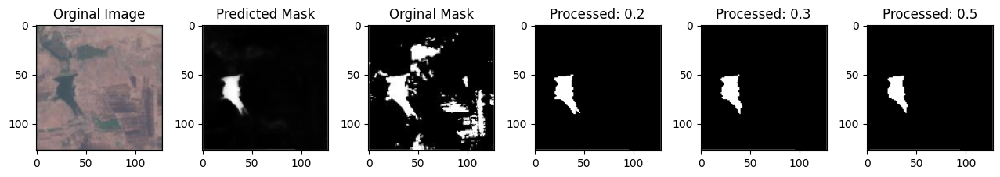

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8369 - loss: 0.1328
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8435 - loss: 0.11


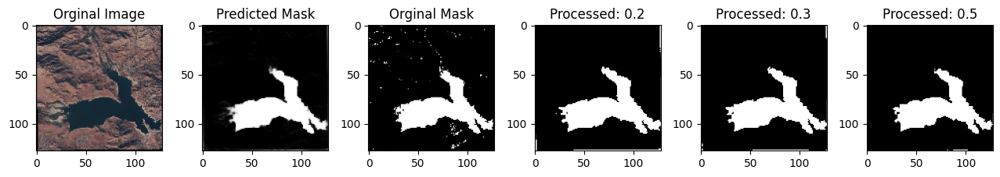

412/412 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - accuracy: 0.8435 - loss: 0.1175


In [20]:
epochs = 100
batch_size = 32

history = model.fit(
    augmented_images_train,  # Use augmented data instead of original
    augmented_masks_train,   # Use augmented masks
    epochs=epochs,
    callbacks=[ShowProgress()],
    batch_size=batch_size,
    shuffle=True             # Make sure to shuffle
)

In [21]:
from datetime import datetime

# Get the current date and time
current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

# Save the model with the current date and time in the filename
model.save(f"../models/{current_time}.keras")

In [ ]:
# Make predictions
predictions = model.predict(images_test)